# Stable Diffusion from Begginer to Master (1) Pipelines and Prompts
> Introduction to Stable Diffusion.

- date: "2022-12-07"
- toc: true 
- badges: true
- comments: true
- categories: [Deep Learning, Python]
- hide: false

# Introduction

Stable Diffusion is a model to generate images from text (aka. prompts). In this guide I will show you:

- How to generate an image using the Pipeline API.
- The meaning of parameters to the Pipeline API and how to make better images by adjusting them.
- How to get great images by tuning the text propmts.
- How to add a final touch to bring your image to a next level.

Hopefully by the end of this tutorial, you will be able to generate high quality images by yourself!

## Setup

To begin our journey, first we need to install some packages.

- `diffusers`  This is the package that we are mainly using for generating images.
- `transformers`  This is the package to encode text into embeddings.
- And a few other supporting packages to work with the above packages.

In [1]:
!pip install -Uqq diffusers transformers ftfy scipy accelerate gradio xformers triton==2.0.0.dev20221120
import pathlib
import huggingface_hub
if not pathlib.Path('/root/.huggingface/token').exists():
  huggingface_hub.notebook_login()

Token is valid.
Your token has been saved in your configured git credential helpers (store).
Your token has been saved to /root/.huggingface/token
Login successful


## Utility Functions

In [6]:
import PIL
import math

def image_grid(imgs, rows=None, cols=None) -> PIL.Image.Image:
  n_images = len(imgs)
  if not rows and not cols:
    cols = math.ceil(math.sqrt(n_images))
  if not rows:
    rows = math.ceil(n_images / cols)
  if not cols:
    cols = math.ceil(n_images / rows)

  w, h = imgs[0].size
  grid = PIL.Image.new('RGB', size=(cols*w, rows*h))

  for i, img in enumerate(imgs):
      grid.paste(img, box=(i%cols*w, i//cols*h))
  return grid

# The Text to Image Pipeline
First let's try to generate some images using the `diffusers` pipeline.
A `pipeline` is an encapsulation class introduced by huggingface. It usually encapsulates multiple models and the connections between them, to provide an easy to use API that generates output from input.

Think of the `StableDiffusionPipeline` it as a black box like this:

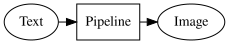

In [ ]:
#| echo: false
#@markdown Pipeline

import graphviz

dot = graphviz.Digraph('pipeline', comment='Pipeline')
dot.node('text', 'Text')
dot.node('pipeline', 'Pipeline', shape='box')
dot.node('image', 'Image')
dot.edge('pipeline', 'image', constraint='false')
dot.edge('text', 'pipeline', constraint='false')
display(dot)

## Initializing the Pipeline
There are two important params to intialize a Pipeline. a `model_id` and a `revision`.

- The `model_id` can be either a huggingface model id or some path in your file system. To find which ones to use, go to [huggingface](https://huggingface.co/stabilityai/stable-diffusion-2) and look for model id at the top. Later when we train our own models we will pass in the path to our trained model.
- The `revision` can be set `fp16` to save GPU memory by using 16 bit numbers.

In [ ]:
import torch
from diffusers import StableDiffusionPipeline

model_id = "stabilityai/stable-diffusion-2-base" #@param ["stabilityai/stable-diffusion-2-base", "stabilityai/stable-diffusion-2", "CompVis/stable-diffusion-v1-4", "runwayml/stable-diffusion-v1-5"] {type:"string"}
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
pipe = StableDiffusionPipeline.from_pretrained(model_id, revision="fp16", torch_dtype=torch.float16).to(device)

Downloading:   0%|          | 0.00/511 [00:00<?, ?B/s]

Fetching 12 files:   0%|          | 0/12 [00:00<?, ?it/s]

Downloading:   0%|          | 0.00/340 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/629 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/681M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/525k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/460 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/820 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/905 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.73G [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/607 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/167M [00:00<?, ?B/s]

## Generating image using the text to image pipeline

To generate an image from text, we just call the `pipe()` method. There are a few arguments to the method:

- `prompt` A text describing the thing you want the image to be.
- `negative_prompt` A text describing the features that you don't want the image to have.
- `generator` This is a random number generator. By default the generator is None, and the output is random for same prompts. A fixed seed allows repeatable experiment (same input-> same output).
- `width` and `height` the dimension of output image.
- `guidance_scale` A scale determining the extent of how your image accurately matches your prompt. In practice I find it not very useful to tune this, just use a 7.5 you will be fine.
- `num_inference_steps` How many steps to run the diffusion algorithm(will explain later). The more steps, the better the image quality, and the more time it takes to generate an image.

In [ ]:
def text2image(pipe,
               prompt: str,
               seed: int,
               return_grid=False,
               grid_size=None,
               **kwargs):
  generator = torch.Generator(device="cuda").manual_seed(seed)

  with torch.autocast("cuda"):
    images = pipe(prompt,
                  generator=generator,
                  **kwargs).images

  if len(images) == 1:
    return images[0]
  elif return_grid:
    return image_grid(images)
  else:
    return images


## Baseline

First let's try using a prompt with all default parameters:

  0%|          | 0/31 [00:00<?, ?it/s]

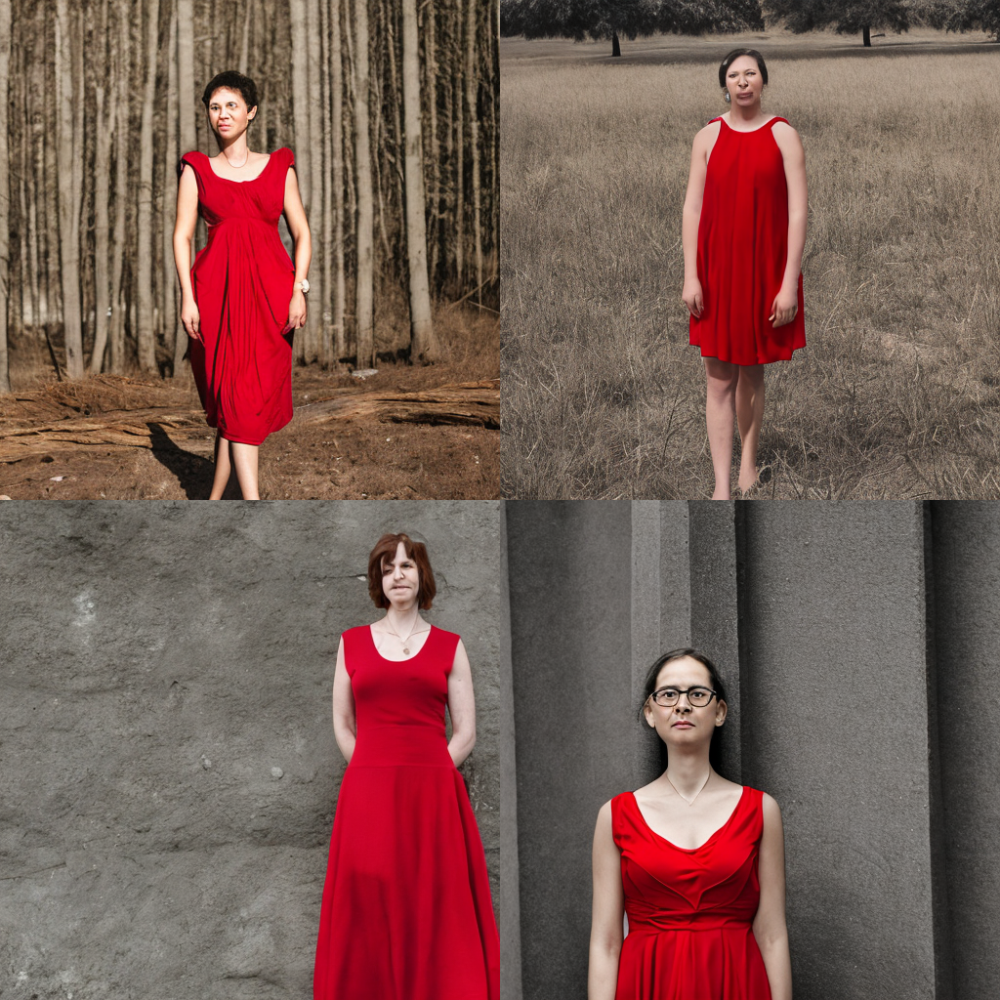

In [ ]:
prompt = "a photo of a woman wearing a red dress"
negative_prompt = ""
num_images_per_prompt = 4
seed = 42
width = height = 512
num_inference_steps = 30
guidance_scale = 7.5


image = text2image(
    pipe,
    prompt=prompt,
    seed=seed,
    return_grid=True,
    width=width,
    height=height,
    num_inference_steps=num_inference_steps,
    guidance_scale=guidance_scale,
    negative_prompt=negative_prompt,
    num_images_per_prompt=num_images_per_prompt)

display(image)

It's terrible! If you get completely unusable images like the above, the first thing to change is the prompts.

## Add Prompts and Negative Prompts
Let's add a few style keywords to the prompt, and then some negative keywords:

  0%|          | 0/31 [00:00<?, ?it/s]

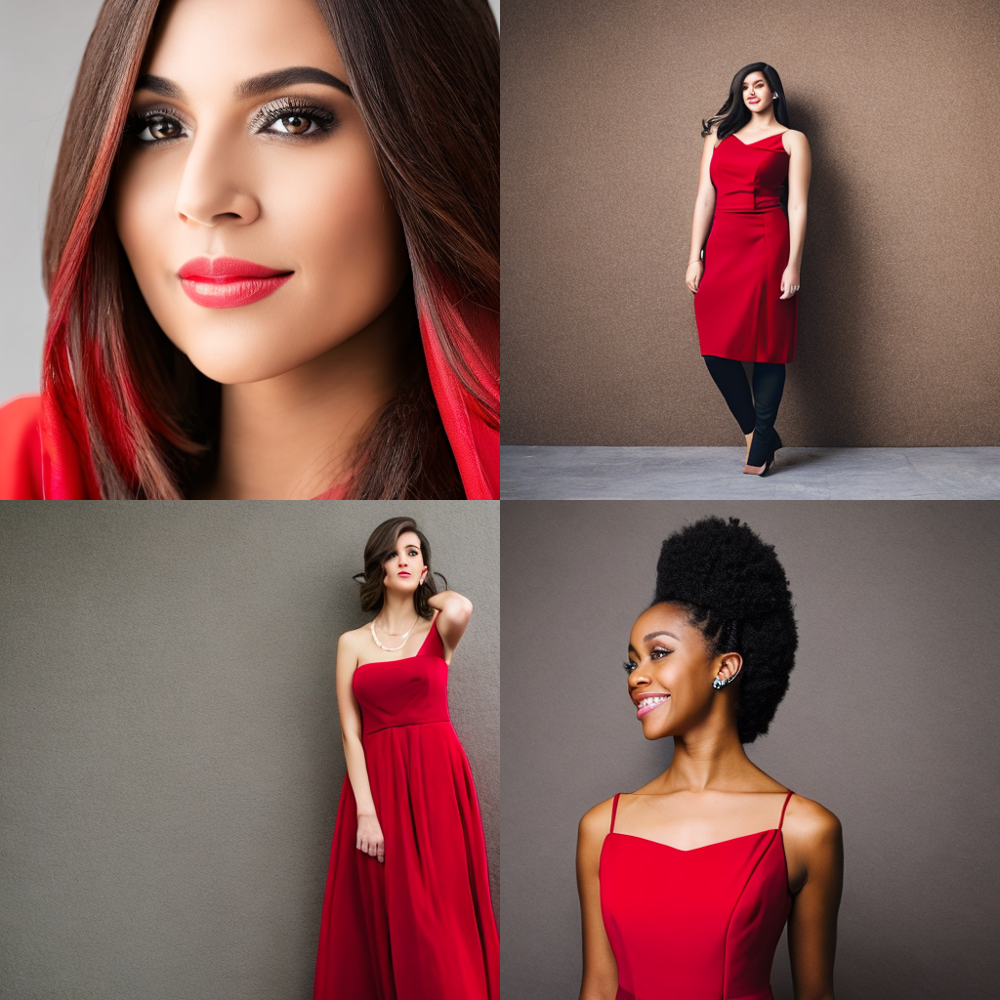

In [ ]:
prompt = "a photo of a woman wearing a red dress, perfect face, dramatically lit,depth of field,smooth gradients"
negative_prompt = "disfigured, kitsch, ugly, oversaturated, grain, low-res, Deformed, blurry, bad anatomy, disfigured, poorly drawn face, mutation, mutated, extra limb, ugly, poorly drawn hands, missing limb, blurry, floating limbs, disconnected limbs, malformed hands, blur, out of focus, long neck, long body, ugly, disgusting, poorly drawn, childish, mutilated, mangled, old, surreal"
num_images_per_prompt = 4
seed = 42
width = height = 512
num_inference_steps = 30
guidance_scale = 7.5

image = text2image(
    pipe,
    prompt=prompt,
    seed=seed,
    return_grid=True,
    width=width,
    height=height,
    num_inference_steps=num_inference_steps,
    guidance_scale=guidance_scale,
    negative_prompt=negative_prompt,
    num_images_per_prompt=num_images_per_prompt)

display(image)

It's far from perfect, but much better than our first try. Generally speaking stable diffusion version 2 works much worse than version 1.5 by default, and it needs much more effort in tuning the prompts.

The negative prompt usually works well for many different images, but for the positive prompts there can be a lot of possiblities.

Now let's build a systematic way of finding prompt additions:

## A random prompt generator

In [ ]:
import random

artists = ['Aaron Douglas','Agnes Lawrence Pelton','Akihiko Yoshida','Albert Bierstadt','Albert Bierstadt','Alberto Giacometti',
           'Alberto Vargas','Albrecht Dürer','Aleksi Briclot','Alex Grey','Alex Horley-Orlandelli','Alex Katz','Alex Ross',
           'Alex Toth','Alexander Jansson','Alfons Maria Mucha','Alfred Kubin','Alphonse Mucha','Anato Finnstark','Anders Zorn',
           'André Masson','Andreas Rocha','Andrew Wyeth','Anish Kapoor','Anna Dittmann','Anna Mary Robertson Moses','Anni Albers',
           'Ansel Adams','Anthony van Dyck','Anton Otto Fischer','Antonio Mancini','April Gornik','Arnold Böcklin','Art Spiegelman',
           'Artemisia Gentileschi','Artgerm','Arthur Garfield Dove','Arthur Rackham','Asher Brown Durand','Aubrey Beardsley',
           'Austin Briggs','Ayami Kojima','Bastien Lecouffe-Deharme','Bayard Wu','Beatrix Potter','Beeple','Beksinski',
           'Bill Sienkiewicz','Bill Ward','Bill Watterson','Bob Eggleton','Boris Vallejo','Brian Bolland','Brian Froud',
           'Bruce Pennington','Bunny Yeager','Camille Corot','Camille Pissarro','Canaletto','Caravaggio','Caspar David Friedrich',
           'Cedric Peyravernay','Charles Addams','Charles Dana Gibson','Chesley Bonestell','Chris Foss','Chris Moore',
           'Chris Rallis','Chriss Foss','Cindy Sherman','Clara Peeters','Claude Monet','Clyde Caldwell','Coles Phillips',
           'Cornelis Bisschop','Coby Whitmore','Craig Mullins','Cynthia Sheppard','Dale Chihuly','Damien Hirst','Dan Mumford',
           'Daniel Merriam','Darek Zabrocki','Dave Dorman','Dave Gibbons','Dave McKean','David Firth','Dean Cornwell','Dean Ellis',
           'Diane Dillon','Disney','Don Maitz','Donato Giancola','Dorothea Tanning','Dreamworks','Dr. Seuss','Earl Norem',
           'Earle Bergey','Earnst Haeckel','Ed Emshwiller','Edgar Degas','Edmund Dulac','Edmund Leighton','Édouard Manet',
           'Edvard Munch','Edward Burne-Jones','Edward Gorey','Edward Hopper','Edward Lear','Edwin Austin Abbey','Edwin Deakin',
           'Egon Schiele','El Greco','Elizabeth Shippen Green','Emmanuel Shiu','Emory Douglas','Esao Andrews','Eugène Delacroix',
           'Evelyn De Morgan','E.H. Shepard','F. Scott Hess','Fairfield Porter','Federico Pelat','Filippino Lippi','Fitz Henry Lane',
           'Francis Bacon','Francisco Goya','Frank Frazetta','Frank Xavier Leyendecker','Franklin Booth','Franz Sedlacek',
           'Frederick Edwin Church','Frederick McCubbin','Gaston Bussière','Gediminas Pranckevicius','Geof Darrow',
           'George B. Bridgman','George Cruikshank','George Inness','George Luks',"Georgia O'Keeffe",'Gerald Brom','Giacomo Balla',
           'Gil Elvgren','Gillis Rombouts','Giorgio de Chirico','Giorgione','Giovanni Battista Piranesi','Greg Hildebrandt',
           'Greg Rutkowski','Greg Staples','Gregory Manchess','Guido Borelli da Caluso','Gustaf Tenggren','Gustav Klimt',
           'Gustave Doré','Gustave Moreau','Gwen John','Hannah Höch','Hans Baldung','Hans Bellmer','Harrison Fisher','Harvey Dunn',
           'Harvey Kurtzman','Henri de Toulouse-Lautrec','Henri Matisse','Henri Rousseau','Henry Ossawa Tanner','Henry Raleigh',
           'Hethe Srodawa','Hieronymus Bosch','Hiromu Arakawa','Hokusai','Howard Chandler Christy','Howard Pyle','Hubert Robert',
           'Hugh Ferriss','Hyun Lee','H.R. Giger','Igor Kieryluk','Igor Morski','Igor Wolkski','Ilya Kuvshinov','Ilya Repin',
           'Inyi Han','Isaac Levitan','Ivan Aivazovsky','Ivan Albright','Ivan Bilibin','Ivan Shishkin','Jacek Yerka','Jack Kirby',
           'Jackson Pollock','Jakub Rozalski','James C. Christensen','James Gillray','James Gurney','James Jean','James Paick',
           'Jamie Hewlett','Jan van Eyck','Janet Fish','Jasper Johns','J.C. Leyendecker','Jean Delville','Jean Giraud',
           'Jean Metzinger','Jean-Honoré Fragonard','Jean-Michel Basquiat','Jeff Easley','Jeff Koons','Jeffrey Smith',
           'Jerome Lacoste','Jerry Pinkney','Jesper Ejsing','Jessie Willcox Smith','Jim Burns','Jim Steranko','Joaquín Sorolla',
           'Joe Jusko','Johannes Vermeer','Johfra Bosschart','John Atkinson Grimshaw','John Bauer','John Berkey','John Constable',
           'John Frederick Kensett','John French Sloan','John Harris','John Howe','John James Audubon','John Martin',
           'John Philip Falter','John Romita Jr','Jon Foster','Jon Whitcomb','Joseph Cornell','Juan Gris','Junji Ito',
           'J.M.W. Turner','Kadir Nelson','Kandinsky','Karol Bak','Kate Greenaway','Kawanabe Kyōsai','Kay Nielsen',
           'Keith Haring','Kelly Freas','Kelly Mckernan','Kim Jung Gi','Kinuko Craft','Konstantin Vasilyev',
           'Konstantinas Ciurlionis','Krenz Cushart','Lale Westvind','Larry Elmore','Laura Muntz Lyall','Laurel Burch',
           'Laurie Lipton','Lawren Harris','Lee Madgwick','Leo and Diane Dillon','Leonora Carrington','Liam Wong','Lise Deharme',
           'Lois van Baarle','Louis Glackens','Louis Janmot','Louise Bourgeois','Lucian Freud','Luis Royo','Lynda Benglis',
           'Lyubov Popova','Maciej Kuciara','Makoto Shinkai','Malevich','Marc Simonetti','Margaret Macdonald Mackintosh',
           'Maria Sibylla Merian','Marianne North','Mario Sanchez Nevado','Mark Ryden','Martin Johnson Heade','Mary Cassatt',
           'Mati Klarwein','Maxfield Parrish','Mead Schaeffer','Michael Hussar','Michael Parkes','Michael Whelan',
           'Mikalojus Konstantinas Čiurlionis','Mike Mignola','Milton Caniff','Milton Glaser','Moebius','Mondrian','M.C. Escher',
           'Noah Bradley','Noriyoshi Ohrai','Norman Rockwell','N.C. Wyeth','Odd Nerdrum','Odilon Redon','Ohara Koson',
           'Paul Cézanne','Paul Delvaux','Paul Gauguin','Paul Klee','Paul Lehr','Peter Elson','Peter Gric','Peter Helck',
           'Peter Max','Peter Mohrbacher','Peter Paul Rubens','Pierre Bonnard','Pierre-Auguste Renoir','Pieter Bruegel the Elder',
           'Pieter Claesz','Pixar','P.A. Works','Rafal Olbinski','Ralph Horsley','Ralph McQuarrie','Randolph Caldecott',
           'Raphael Lacoste','Ray Caesar','Raymond Swanland','Rebecca Guay','Rembrandt','Rembrandt van Rijn','Rene Magritte',
           'RHADS','Richard Dadd','Richter','Rob Gonsalves','Robert Delaunay','Robert McCall','Robert McGinnis',
           'Robert Rauschenberg','Roberto da Matta','Rockwell Kent','Rodney Matthews','Roger Ballen','Roger Dean','Ron Walotsky',
           'Rossdraws','Ross Tran','Roz Chast','Salvador Dalí','Sam Spratt','Sandro Botticelli','Saul Steinberg','Saul Tepper',
           'Seb McKinnon','Simon Bisley','Simon Stalenhag','Sir John Tenniel','Slawomir Maniak','Sonia Delaunay','sparth',
           'Stephan Martiniere','Stevan Dohanos','Steve Dillon','Steven DaLuz','Studio Ghibli','Syd Mead','Sylvain Sarrailh',
           'Takashi Murakami','Takato Yamamoto','Takeshi Obata','Tamara Lempicka','Taro Okamoto','Ted DeGrazia','Ted Nasmith',
           'Terry Oakes','Terry Redlin','Thomas Cole','Thomas Kinkade','Thomas Nast','Thornton Oakley','Brothers Hildebrandt',
           'Tim White','Titian','Tom Lovell','Tom Thomson','Tomek Setowski','Tomer Hanuka','Tomi Ungerer','Tomokazu Matsuyama',
           'Tony Sart','Tsutomu Nihei','Tyler Edlin','Utagawa Kuniyoshi','Victo Ngai','Vincent Di Fate','Vladimir Kush',
           'Wally Wood','Walter Beach Humphrey','Walter Crane','Warwick Goble','Wassily Kandinsky','Wayne Barlowe','Wendy Froud',
           'Wifredo Lam','Will Eisner','William Hogarth','William Michael Harnett','William Steig','William Stout',
           'William-Adolphe Bouguereau','Winslow Homer','Winsor McCay','WLOP','Yayoi Kusama','Yoshitaka Amano','Yue Minjun',
           'Yves Tanguy','Zdzisław Beksiński']

juice = ['dynamic composition','cinematic lighting','intricate','studio quality','highly detailed',
          'digital painting', 'artstation', 'matte', 'sharp focus','hyper detailed', 'super sharp',
          'crisp', 'smooth', 'smooth gradients', 'depth of field','insanely detailed and intricate',
          'hypermaximalist', 'elegant', 'ornate', 'hyper realistic', 'super detailed', 'cinematic light',
          'ray tracing', 'volumetric lighting', 'octane render','cinematic lighting', 'highly detailed',
          'sharp focus', 'professional photoshoot', '8k', 'DOF','dramatically lit', '1ms shutter speed',
          'back lighting', 'F 2.8 lens']

style = ['2d game art','3D VR painting','8k resolution','1950s pulp sci-fi cover','anime','artistic photograph','Baroque painting','Byzantine mosaic','Chiaroscuro painting','depth of field','digital painting','dutch golden age','filmed in IMAX','fine art','flat shading','Flemish Baroque','Fresco painting','Gouache Painting','graffiti','Grisaille painting','highly detailed','hyperrealism','Impasto painting','low-poly','Luminism painting','Marvel Comics','matte painting','mixed media','oil painting','Panorama','parallax','pastel painting','pencil sketch','Perspective painting','Playstation 5 screenshot','pop art','raytracing','rendered in cinema4d','rendered in maya','rendered in zbrush','schematic','sculpture','Sfumato painting','shot on 70mm','Sotto In Su','storybook illustration','surrealist art','surveillance footage','Tempera Painting','tilt shift','Trompe L’oeil','Ukiyo-e','unreal engine render','vector image','Veduta painting','visionary hypermaximalism','volumetric lighting','vray tracing']
sites = ['500px','ArtStation','Behance','cgsociety','ConceptArtWorld','DeviantArt','Flickr','Getty Images','Pixiv','unsplash','zbrushcentral']
genre = ['anime','art deco','antique lithograph','concept','cyberpunk','dark fantasy','enlightenment','fantasy','fauvism','film noir','gothic','holography','linocut','massurrealism','medieval','monochrome','oil painting','pencil sketch','photoreal','post-impressionist','postmodern','psychedelic','renaissance','sci-fi','steampunk','clean vector','victorian','vintage','woodblock']

prompt_ideas_map = {'artists': artists,'juice': juice, 'style': style, 'sites': sites, 'genre': genre}

def get_random_style():
  styles = []
  for k, v in prompt_ideas_map.items():
    if k == 'artists':
      # only 1 artist
      if random.random() > 0.1:
        artist = random.choice(v)
        styles.append(f'by {artist}')
    else:
      count = random.randint(0, 3)
      if count > 0:
        styles.extend(random.sample(v, k=count))
  return ', '.join(styles)

get_random_style()

'by Chris Rallis, dynamic composition, Gouache Painting, pencil sketch, Behance, cgsociety, gothic, monochrome, antique lithograph'

Now let's try our prompt generator: (change the seed to get different prompts)

a photo of a woman wearing a red dress, perfect face, by Alex Ross, insanely detailed and intricate, depth of field, surveillance footage
a photo of a woman wearing a red dress, perfect face, by Alfred Kubin, cgsociety
a photo of a woman wearing a red dress, perfect face, by Syd Mead, depth of field, professional photoshoot, elegant, Flickr, fauvism, cyberpunk
a photo of a woman wearing a red dress, perfect face, by Tony Sart, artstation, digital painting, Baroque painting, Impasto painting, Veduta painting, unsplash, ConceptArtWorld


  0%|          | 0/31 [00:00<?, ?it/s]

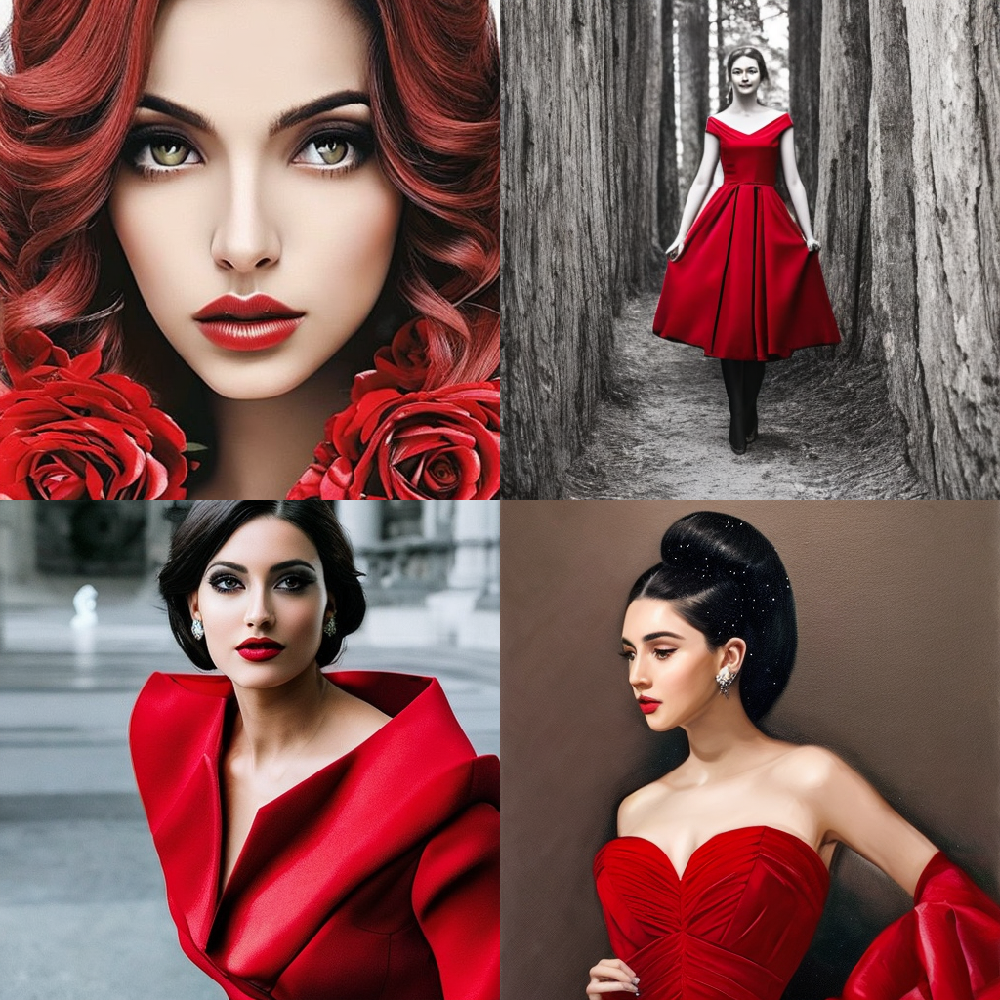

In [ ]:
random.seed(42)
prompt = "a photo of a woman wearing a red dress, perfect face, "

negative_prompt = "disfigured, kitsch, ugly, oversaturated, grain, low-res, Deformed, blurry, bad anatomy, disfigured, poorly drawn face, mutation, mutated, extra limb, ugly, poorly drawn hands, missing limb, blurry, floating limbs, disconnected limbs, malformed hands, blur, out of focus, long neck, long body, ugly, disgusting, poorly drawn, childish, mutilated, mangled, old, surreal"
seed = 42
width = height = 512
num_inference_steps = 30
guidance_scale = 7.5
count = 4
prompts = [prompt + get_random_style() for _ in range(count)]
print('\n'.join(prompts))

image = text2image(
    pipe,
    prompt=prompts,
    seed=seed,
    return_grid=True,
    width=width,
    height=height,
    num_inference_steps=num_inference_steps,
    guidance_scale=guidance_scale,
    negative_prompt=[negative_prompt] * count,
    num_images_per_prompt=1)

display(image)

Now that's much much better! We haven't changed anything other than just the positive and negative prompts. If you have really bad images, the first thing you would like to change is the prompts.

For more ideas of prompts, https://lexica.art/ is a good place to find what other people are using.

# Fixing your images

The diffusion model generates the image by staring with a "random" image, and removing noise step by step to get a "good" image. The hardest part for the model is actually the initial steps. Suppose you get an image that is good overall, but some of the details are not ideal, you don't need to try another random seed or prompt - there are many ways you can improve it.

Now suppose we generated the following image:

  0%|          | 0/31 [00:00<?, ?it/s]

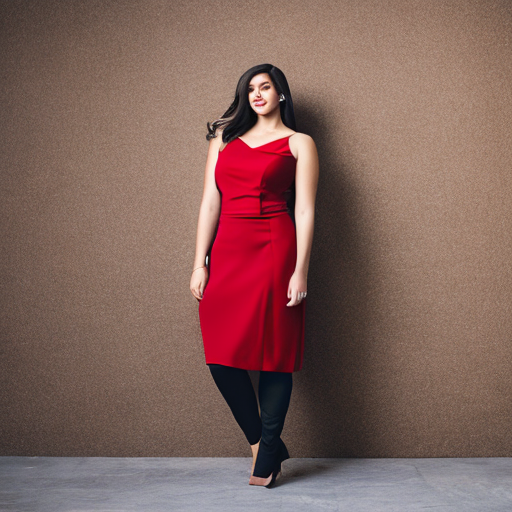

In [ ]:
prompt = "a photo of a woman wearing a red dress, perfect face, dramatically lit,depth of field,smooth gradients"
negative_prompt = "disfigured, kitsch, ugly, oversaturated, grain, low-res, Deformed, blurry, bad anatomy, disfigured, poorly drawn face, mutation, mutated, extra limb, ugly, poorly drawn hands, missing limb, blurry, floating limbs, disconnected limbs, malformed hands, blur, out of focus, long neck, long body, ugly, disgusting, poorly drawn, childish, mutilated, mangled, old, surreal"
num_images_per_prompt = 4
seed = 42
width = height = 512
num_inference_steps = 30
guidance_scale = 7.5

image = text2image(
    pipe,
    prompt=prompt,
    seed=seed,
    return_grid=False,
    width=width,
    height=height,
    num_inference_steps=num_inference_steps,
    guidance_scale=guidance_scale,
    negative_prompt=negative_prompt,
    num_images_per_prompt=num_images_per_prompt)

image_to_fix = image[1]
image_to_fix.save('image_to_fix.jpg')
display(image_to_fix)

The overall image looks ok, but the person looks pretty bad. Let's try to fix it.

(You might need to restart the notebook to collect GPU memory)

## Refine your image using Image2Image

The image to image pipeline allows you to start from an initial image rather than a random one.

In [ ]:
from diffusers import StableDiffusionImg2ImgPipeline

model_id = "stabilityai/stable-diffusion-2-base" #@param ["stabilityai/stable-diffusion-2-base", "stabilityai/stable-diffusion-2", "CompVis/stable-diffusion-v1-4", "runwayml/stable-diffusion-v1-5"] {type:"string"}
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
pipe_i2i = StableDiffusionImg2ImgPipeline.from_pretrained(
    model_id, revision="fp16", torch_dtype=torch.float16).to(device)

Fetching 12 files:   0%|          | 0/12 [00:00<?, ?it/s]

Most of the Image2Image pipeline parameters should look similar, except:

- `init_image` this is the image you start from, i.e. the image you want to fix.
- `strength` and `steps`: strength is a number between 0-1, meaning how much your output depends on your init image. For example a 0.6 strength for 100 steps means doing diffusion starting from 40% of the init image, and then do 60 steps.


  0%|          | 0/121 [00:00<?, ?it/s]

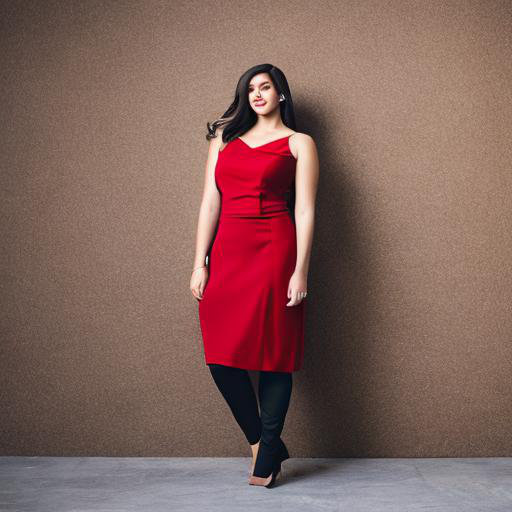

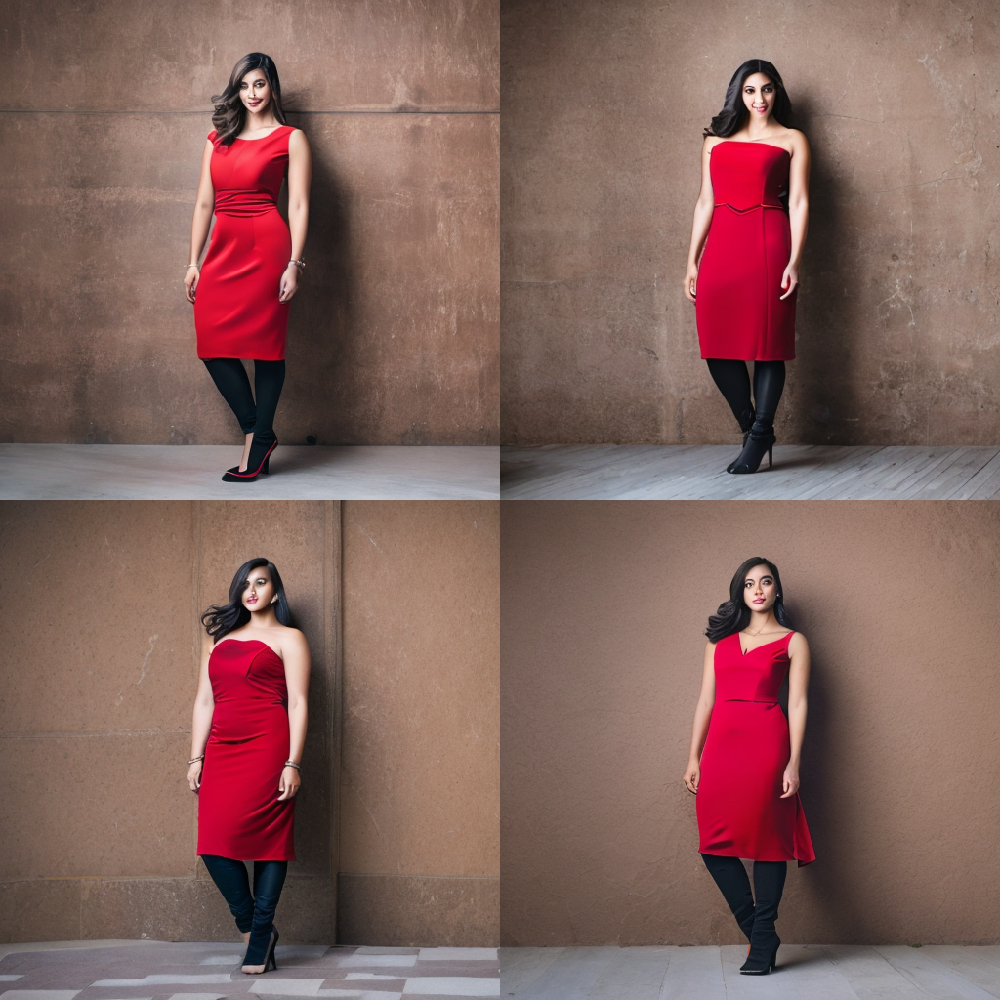

In [ ]:
import PIL
image = PIL.Image.open('image_to_fix.jpg')

prompt = "a photo of a woman wearing a red dress, perfect face, dramatically lit,depth of field,smooth gradients"
negative_prompt = "disfigured, kitsch, ugly, oversaturated, grain, low-res, Deformed, blurry, bad anatomy, disfigured, poorly drawn face, mutation, mutated, extra limb, ugly, poorly drawn hands, missing limb, blurry, floating limbs, disconnected limbs, malformed hands, blur, out of focus, long neck, long body, ugly, disgusting, poorly drawn, childish, mutilated, mangled, old, surreal"
num_images_per_prompt = 4
seed = 42
num_inference_steps = 200
strength=0.6
guidance_scale = 7.5
generator = torch.Generator(device="cuda").manual_seed(seed)

images = pipe_i2i(
    init_image=image,
    prompt=prompt,
    negative_prompt=negative_prompt,
    strength=strength,
    num_inference_steps=num_inference_steps,
    generator=generator,
    guidance_scale=guidance_scale,
    num_images_per_prompt=num_images_per_prompt
).images

display(image)
display(image_grid(images))

Note that for the image2image, I used way more steps - since I want to improve the quality.

Now comparing the generated images to the initial one, there are some images that are better. The second one is already quite good, while the first one is good except for the eyes. How can we fix that? Let's first save it:

In [ ]:
images[0].save('image_fix_eye.jpg')

## Fixing your image using Inpainting

The in-painting pipeline allows you to mask a region of the image, and re-generate only that region. Thus this is useful for adding small fixes to our images.

In [ ]:
from diffusers import DiffusionPipeline, DPMSolverMultistepScheduler, StableDiffusionInpaintPipeline, EulerAncestralDiscreteScheduler
import torch

model_id = "runwayml/stable-diffusion-inpainting" #@param ["stabilityai/stable-diffusion-2-inpainting", "runwayml/stable-diffusion-inpainting"] {type:"string"}

if model_id == "runwayml/stable-diffusion-inpainting":
  inp_pipe = StableDiffusionInpaintPipeline.from_pretrained(
      model_id,
      revision="fp16",
      torch_dtype=torch.float16,
      use_auth_token=True
  ).to("cuda")
elif model_id == "stabilityai/stable-diffusion-2-inpainting":
  inp_pipe = DiffusionPipeline.from_pretrained(
        model_id,
        revision="fp16",
        torch_dtype=torch.float16,
        # scheduler=scheduler # TODO currently setting scheduler here messes up the end result. A bug in Diffusers🧨
      ).to("cuda")
  inp_pipe.scheduler = DPMSolverMultistepScheduler.from_config(inp_pipe.scheduler.config)
  inp_pipe.enable_attention_slicing()
  # inp_pipe.enable_xformers_memory_efficient_attention()

inp_pipe.scheduler = EulerAncestralDiscreteScheduler(
    num_train_timesteps=1000,
    beta_end=0.012,
    beta_start=0.00085,
    beta_schedule="linear",
)

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

/usr/local/lib/python3.8/dist-packages/diffusers/models/attention.py:433: UserWarning: Could not enable memory efficient attention. Make sure xformers is installed correctly and a GPU is available: No such operator xformers::efficient_attention_forward_generic - did you forget to build xformers with `python setup.py develop`?
  warnings.warn(


To use the in-painting pipeline, there is only one new paramter:
- `mask_image` this is a black-white image where white pixels will be repainted, and black pixels will be preserved.

For the purpose of fixing our image, we just use the same prompts for generating this image. To ease the generation of a mask, we can use the gradio Web UI.

In [ ]:
import gradio as gr

prompt = "a photo of a woman wearing a red dress, perfect face, dramatically lit,depth of field,smooth gradients"
negative_prompt = "disfigured, kitsch, ugly, oversaturated, grain, low-res, Deformed, blurry, bad anatomy, disfigured, poorly drawn face, mutation, mutated, extra limb, ugly, poorly drawn hands, missing limb, blurry, floating limbs, disconnected limbs, malformed hands, blur, out of focus, long neck, long body, ugly, disgusting, poorly drawn, childish, mutilated, mangled, old, surreal"
num_images_per_prompt = 4
seed = 42
num_inference_steps = 30
guidance_scale = 7.5
generator = torch.Generator(device="cuda").manual_seed(seed)


def inpaint(input_image):
  image, mask = input_image['image'], input_image['mask']
  image = image.resize((512,512))
  mask = mask.resize((512,512))

  print('image:')
  display(image)
  print('mask:')
  display(mask)

  images = inp_pipe(
      prompt=prompt,
      negative_prompt=negative_prompt,
      image=image,
      mask_image=mask.convert('RGB'),
      width=512,
      height=512,
      generator=generator,
      guidance_scale=guidance_scale,
      num_inference_steps=num_inference_steps,
      num_images_per_prompt=num_images_per_prompt,
  ).images

  result = image_grid(images)
  print('result:')
  display(result)
  return result

with gr.Blocks() as demo:
  gr.Markdown('In painting demo')

  with gr.Row():
    with gr.Column():
      input_image = gr.Image(label='Input', type = 'pil', tool='sketch', height=1024)
      button = gr.Button('Inpaint')
    with gr.Column():
      output_image = gr.Image(label='Output', height=1024)

  button.click(inpaint, inputs=input_image, outputs=output_image)

demo.launch(debug=True, share=True)

By Default the in painting works terrible when fixing a small region:


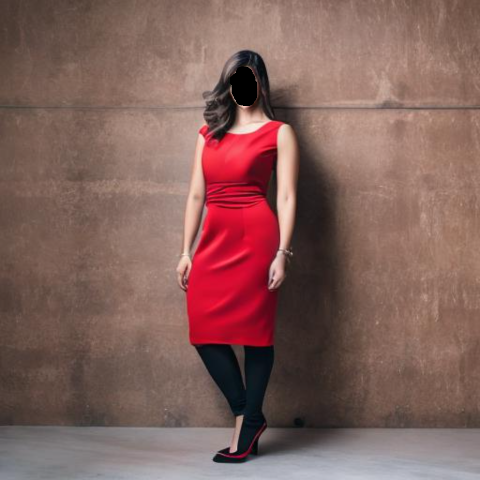

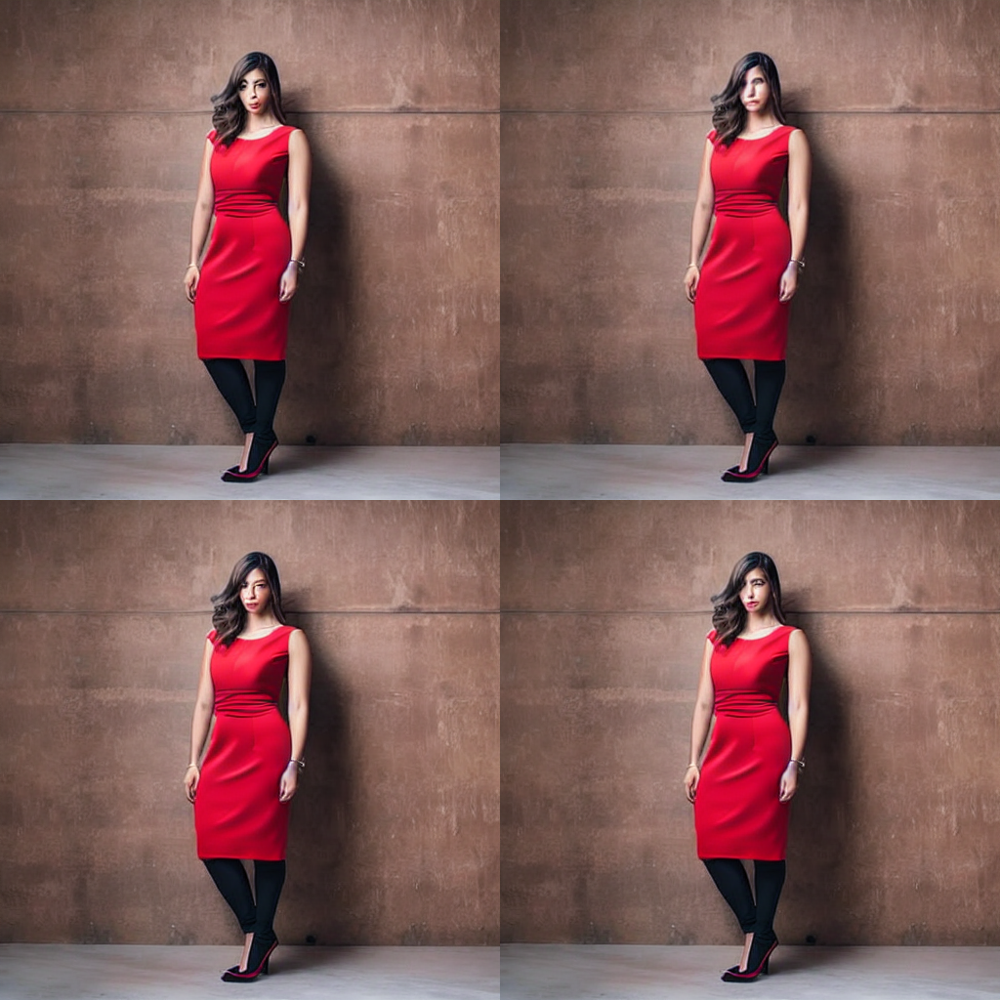

In [12]:
#| echo: false
def display_image(path):
  display(PIL.Image.open(path))

display_image('mask1.png')
display_image('fix1.png')

But If we apply a small trick: zoom in on the area, then fix a larger portion, it will do a much better job:

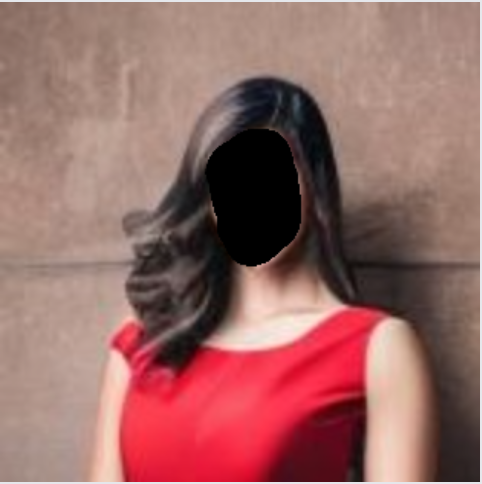

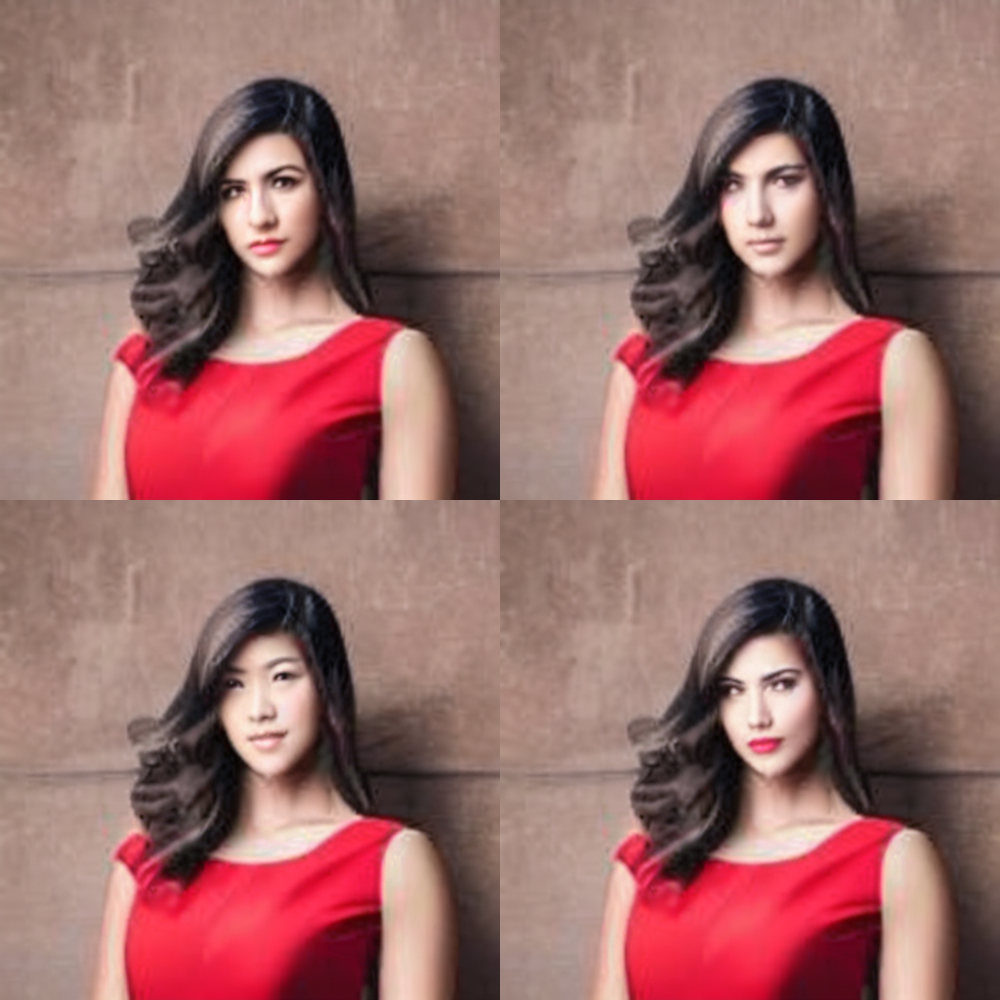

In [13]:
#| echo: false
display_image('mask2.png')
display_image('fix2.png')

Thus, if we can programmatically "zoom in", fix the region, then paste to the original image, we can do a much better job. This is left to the reader as an interesting excercise.

## Upsampling your image

You can boost our image resolution even higher by using the upsampler. Note this takes a lot of GPU memory.

In [2]:
from diffusers import DiffusionPipeline
import torch

upscale_pipe = DiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-x4-upscaler",
    revision="fp16",
    torch_dtype=torch.float16).to("cuda")

Need to compile C++ extensions to get sparse attention suport. Please run python setup.py build develop


/usr/local/lib/python3.8/dist-packages/xformers/_C.so: undefined symbol: _ZNK3c104impl13OperatorEntry20reportSignatureErrorENS0_12CppSignatureE


Downloading:   0%|          | 0.00/485 [00:00<?, ?B/s]

Fetching 14 files:   0%|          | 0/14 [00:00<?, ?it/s]

Downloading:   0%|          | 0.00/300 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/348 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/634 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/681M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/525k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/460 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/825 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/977 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/982 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/947M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/558 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/111M [00:00<?, ?B/s]

/usr/local/lib/python3.8/dist-packages/diffusers/models/attention.py:433: UserWarning: Could not enable memory efficient attention. Make sure xformers is installed correctly and a GPU is available: No such operator xformers::efficient_attention_forward_generic - did you forget to build xformers with `python setup.py develop`?
  warnings.warn(


  0%|          | 0/30 [00:00<?, ?it/s]

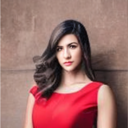

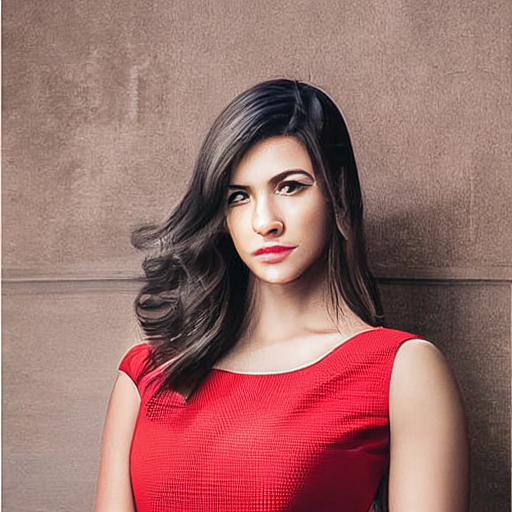

In [6]:
import PIL
prompt = "a photo of a woman wearing a red dress, perfect face, dramatically lit,depth of field,smooth gradients"
negative_prompt = "disfigured, kitsch, ugly, oversaturated, grain, low-res, Deformed, blurry, bad anatomy, disfigured, poorly drawn face, mutation, mutated, extra limb, ugly, poorly drawn hands, missing limb, blurry, floating limbs, disconnected limbs, malformed hands, blur, out of focus, long neck, long body, ugly, disgusting, poorly drawn, childish, mutilated, mangled, old, surreal"
seed = 42
num_inference_steps = 30
guidance_scale = 7.5
generator = torch.Generator(device="cuda").manual_seed(seed)
image = PIL.Image.open('low_res.png').convert('RGB').resize((128,128))

upscale_image = upscale_pipe(
    image=image,
    prompt=prompt,
    negative_prompt=negative_prompt,
    num_inference_steps=num_inference_steps,
    guidance_scale=guidance_scale,
    generator=generator
).images[0]

display(image)
display(upscale_image)